In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import requests
import json
import os
import wget
from pandas.io.json import json_normalize
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from datetime import datetime as dt
from IPython.display import Image
from IPython.display import HTML
#Requisição
headers = {
    'authority': 'xx9p7hp1p7.execute-api.us-east-1.amazonaws.com',
    'accept': 'application/json, text/plain, */*',
    'sec-fetch-dest': 'empty',
    'x-parse-application-id': 'unAFkcaNDeXajurGB7LChj8SgQYS2ptm',
    'origin': 'https://covid.saude.gov.br',
    'sec-fetch-site': 'cross-site',
    'sec-fetch-mode': 'cors',
    'referer': 'https://covid.saude.gov.br/',
    'accept-language': 'en-US,en;q=0.9,pt;q=0.8',
}
geral = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalGeral', headers=headers)
geral = json.loads(geral.content)['results']
geral = pd.DataFrame(geral)
link= json_normalize(geral['arquivo']) 
url_ms = str(link.name.values).replace('[', '')
url_ms = str(url_ms).replace(']', '')
url_ms = str(url_ms).replace("'", '')
#########VALIDO ATÉ 10/05/2020###########################
#total = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalAcumulo', headers=headers)
#mapa = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalMapa', headers=headers)
#geral = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalGeral', headers=headers)
#semana = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalSemana', headers=headers)
#dia = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalDias', headers=headers)
#regiao = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalRegiao', headers=headers)
#estado= requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalEstado', headers=headers)
#Transformando json
#total = json.loads(total.content)['results']
#mapa = json.loads(mapa.content)['results']
#geral = json.loads(geral.content)['results']
#semana = json.loads(semana.content)['results']
#dia = json.loads(dia.content)['results']
#regiao = json.loads(regiao.content)['results']
#estado = json.loads(estado.content)['results']
#Criando os DF
#mapa = pd.DataFrame(mapa)
#mapa = mapa.drop(['objectId',  'createdAt', 'percent'], axis=1)
#acumulado = pd.DataFrame(total)
#acumulado = acumulado.drop(['objectId', 'createdAt'], axis=1)
#geral = pd.DataFrame(geral)
#geral = geral.drop(['objectId','createdAt','updatedAt','versao','arquivo','arquivo_srag'], axis=1)
#semana = pd.DataFrame(semana)
#semana = semana.drop(['objectId','createdAt','updatedAt'], axis=1)
#dia = pd.DataFrame(dia)
#dia = dia.drop(['objectId','createdAt','updatedAt'], axis=1)
#regiao = pd.DataFrame(regiao)
#regiao = regiao.drop(['objectId','color','percent','createdAt','updatedAt'], axis=1)
#Gera os acquivos CSV

semana = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalCasos', headers=headers)
semana = json.loads(semana.content)['semana']
semana = pd.DataFrame(semana)

acumulado = requests.get('https://xx9p7hp1p7.execute-api.us-east-1.amazonaws.com/prod/PortalCasos', headers=headers)
acumulado = json.loads(acumulado.content)['dias']
acumulado = pd.DataFrame(acumulado)


################################################################################################### 
#A URL muda diariamente 
url_ministerio_saude = ('https://mobileapps.saude.gov.br/esus-vepi/files/unAFkcaNDeXajurGB7LChj8SgQYS2ptm/'+url_ms)
if os.path.exists('DB/ministerio_saude.xlsx'):
    os.remove('DB/ministerio_saude.xlsx')
    wget.download(url_ministerio_saude, 'DB/ministerio_saude.xlsx')
else:
    wget.download(url_ministerio_saude, 'DB/ministerio_saude.xlsx')




#mapa.to_csv('DB/MS/covid_mapa_br.csv')
acumulado.to_csv('DB/MS/covid_acumulado_br.csv')
#geral.to_csv('DB/MS/covid_geral_br.csv') 
semana.to_csv('DB/MS/covid_semana_br.csv') 
#estados.to_csv('DB/MS/covid_estados_br.csv')
#regiao.to_csv('DB/MS/covid_regiao_br.csv') 

C:\Users\joner\anaconda3\lib\site-packages\ipykernel_launcher.py:30: FutureWarning:

pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead



100% [..........................................................................] 7653998 / 7653998

In [2]:
#Leitura dos Arquiso CSV
#mapa = pd.read_csv('DB/MS/covid_mapa_br.csv', encoding='utf-8')
acumulado = pd.read_csv('DB/MS/covid_acumulado_br.csv', encoding='utf-8')
#geral= pd.read_csv('DB/MS/covid_geral_br.csv', encoding='utf-8')
semana= pd.read_csv('DB/MS/covid_semana_br.csv', encoding='utf-8')
#estados= pd.read_csv('DB/MS/covid_estados_br.csv', encoding='utf-8')
#regiao= pd.read_csv('DB/MS/covid_regiao_br.csv', encoding='utf-8')
estados = pd.ExcelFile('DB/ministerio_saude.xlsx')
df= pd.read_excel(estados)
regiao = df.groupby(['regiao']).sum()
regiao

,coduf,codmun,codRegiaoSaude,semanaEpi,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos
regiao,,,,,,,,,,
Brasil,7524,0.000000e+00,0.000000e+00,1584,10669778,584015,668701,32548,4221497.0,5418009.0
Centro-Oeste,474758,4.585547e+09,4.535866e+08,182407,705465,41935,16673,887,0.0,0.0
Nordeste,1345914,1.332116e+10,1.318031e+09,1077035,7024215,406353,387691,20342,0.0,0.0
Norte,217057,2.101072e+09,2.091192e+08,300375,3955320,242435,236462,12922,0.0,0.0
Sudeste,1476410,1.475890e+10,1.460590e+09,870805,8600956,419518,666411,30533,0.0,0.0
Sul,1200670,1.193480e+10,1.187488e+09,557641,1039771,51285,30761,1223,0.0,0.0


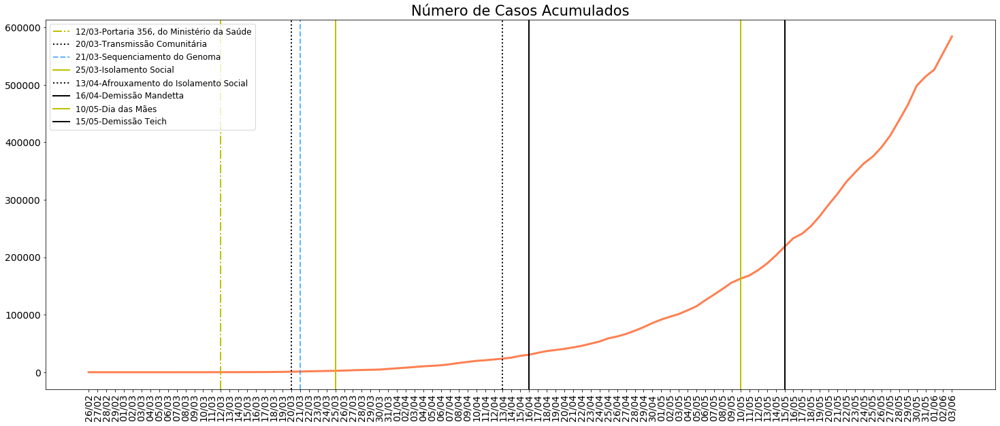

In [3]:
plt.figure(figsize=(25, 10))
plt.plot(acumulado._id, acumulado['casosAcumulado'].to_numpy(), linewidth=3, color='coral', label=None)
plt.xticks(acumulado._id, rotation=90, fontsize=14)
plt.yticks(fontsize=14)
plt.title('Número de Casos Acumulados', fontsize=21)


plt.axvline('12/03', 0, 8000, color='y', linestyle='-.', linewidth=2, alpha=1, label='12/03-Portaria 356, do Ministério da Saúde')
plt.axvline('20/03', 0, 8000, color='k', linestyle='dotted', linewidth=2, alpha=1, label='20/03-Transmissão Comunitária')
plt.axvline('21/03', 0, 8000, color='dodgerblue', linestyle='--', linewidth=2, alpha=0.7, label='21/03-Sequenciamento do Genoma')
plt.axvline('25/03', 0, 8000, color='y', linestyle='-', linewidth=2, alpha=1, label='25/03-Isolamento Social')
plt.axvline('13/04', 0, 8000, color='k', linestyle=':', linewidth=2, alpha=1, label='13/04-Afrouxamento do Isolamento Social')
plt.axvline('16/04', 0, 8000, color='k', linestyle='-', linewidth=2, alpha=1, label='16/04-Demissão Mandetta')
plt.axvline('10/05', 0, 8000, color='y', linestyle='-', linewidth=2, alpha=1, label='10/05-Dia das Mães')
plt.axvline('15/05', 0, 8000, color='k', linestyle='-', linewidth=2, alpha=1, label='15/05-Demissão Teich')
plt.legend(loc=2, fancybox=True, fontsize=12)
plt.show()

In [4]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
df_regiao = regiao.copy()
labels = df_regiao.index
values_casos_acumulado = df_regiao['casosAcumulado']
values_obitos_acumulado = df_regiao['obitosAcumulado']

# Create subplots: use 'domain' type for Pie subplot
regiao = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
regiao.add_trace(go.Pie(labels=labels, values=values_casos_acumulado, name="Casos de Covid19"),
              1, 1)
regiao.add_trace(go.Pie(labels=labels, values=values_obitos_acumulado, name="Óbitos por COVID19"),
              1, 2)

# Use `hole` to create a donut-like pie chart
regiao.update_traces(hole=.4, hoverinfo="label+percent+value")

regiao.update_layout(
    title_text="Casos e Óbitos acumulado por região",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Casos', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Óbitos', x=0.82, y=0.5, font_size=20, showarrow=False)])
regiao.show()

#plotly.offline.plot(fig3, filename='HTML/PercentualAcumuladoRegiaoDia.html', auto_open=False)

In [5]:
#Gráfico casos acumlados
import cufflinks as cf
df_acumulado =acumulado.copy()
fig_acumulado = go.Figure(
    [
        go.Scatter(x = df_acumulado._id, y = df_acumulado['casosAcumulado'], mode = 'markers+lines', name="Casos acumulado por dia"),
        go.Scatter(x = df_acumulado._id, y = df_acumulado['obitosAcumulado'], mode = 'markers+lines', name="Óbitos acumulado por dia"),
    
    ]
)

#plotly.offline.plot(fig, filename='HTML/NovosCasosObitosAcumuladoBrasilDia.html', auto_open=False)

In [6]:
import plotly.graph_objects as go
df_semana = semana.copy()
fig_semana = go.Figure(data=[
    go.Bar(name='Casos', x=df_semana._id, y=df_semana['casosAcumulado'],text=df_semana['casosAcumulado'],textposition='auto'),
    go.Bar(name='Óbitos', x=df_semana._id, y=df_semana['obitosAcumulado'],text=df_semana['obitosAcumulado'],textposition='auto'),
])

In [7]:
import cufflinks as cf
from datetime import datetime
df_dia =acumulado.copy()
fig_dia = go.Figure()
    
fig_dia.add_trace(go.Scatter(x = df_dia._id, y = df_dia['casosNovos'], name="Casos novos por dia",fill='tonexty'))


fig_dia.update_layout(title='Casos Novos Por Dia',
                   plot_bgcolor='rgb(230, 230,230)',
                   showlegend=True, template="plotly_white",
)

fig_dia.show()
#plotly.offline.plot(fig2, filename='HTML/NovosCasosBrasilDia.html', auto_open=False)

In [8]:
import plotly.express as px
df_estados =df.copy()
fig = go.Figure(
    [
        go.Scatter(x = df_estados.data, y = df_estados['casosAcumulado'], mode = 'markers+lines', name="Casos novos por dia")
       
    ]
)


fig.update_layout(title='Casos e Óbitos Acumulado Por Dia',
                   plot_bgcolor='rgb(230, 230,230)',
                   showlegend=True, template="plotly_white")

fig.show()
#plotly.offline.plot(fig, filename='HTML/CasosAcumuladoEstadosDia.html', auto_open=False)

In [8]:
fig_acumulado.update_layout(title='Casos e Óbitos Acumulado Por Dia', plot_bgcolor='rgb(230, 230,230)',showlegend=True, template="plotly_white")
fig_acumulado.show()
fig_dia.update_layout(title='Casos novos de COVID-19 por data de confirmação', plot_bgcolor='rgb(230, 230,230)',showlegend=True, template="plotly_white")
fig_dia.show()
fig_semana.update_layout(title='Casos e óbitos de COVID-19 por semana epidemiológica de confirmação', plot_bgcolor='rgb(230, 230,230)',showlegend=True,barmode='stack', template="plotly_white")
fig_semana.show()
regiao.show()

In [9]:
df
estados = df.groupby([df['estado'], df['data']]).sum().reset_index()
estados['data'] = pd.to_datetime(estados['data'], format='%Y-%m-%d',errors='coerce', dayfirst=False)
estados.head()

,estado,data,coduf,codmun,codRegiaoSaude,semanaEpi,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos
0,AC,2020-03-19,12,0.0,0.0,12,3,0,0,0,0.0,0.0
1,AC,2020-03-20,12,0.0,0.0,12,7,4,0,0,0.0,0.0
2,AC,2020-03-21,12,0.0,0.0,12,9,2,0,0,0.0,0.0
3,AC,2020-03-22,12,0.0,0.0,13,11,2,0,0,0.0,0.0
4,AC,2020-03-23,12,0.0,0.0,13,11,0,0,0,0.0,0.0


In [10]:
current_year = '2020-02-28'
dff = (estados[estados['data'].eq(current_year)]
       .sort_values(by='casosAcumulado', ascending=True)
       .head(27))
dff


,estado,data,coduf,codmun,codRegiaoSaude,semanaEpi,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos
2046,SP,2020-02-28,35,0.0,0.0,9,1,0,0,0,0.0,0.0


In [11]:
import matplotlib.pyplot as plt
import random
#import imread
#urlico =imread('https://www.quatrocantos.com/clipart/bandeiras/bandeiras_estados_brasileiros/rio_grande_do_sul.gif')
paths = dict(zip(
   ['RO', 'AC', 'AM', 'RR', 'PA', 'AP', 'TO', 'MA', 'PI', 'CE', 'RN',
       'PB', 'PE', 'AL', 'SE', 'BA', 'MG', 'ES', 'RJ', 'SP', 'PR', 'SC',
       'RS', 'MS', 'MT', 'GO', 'DF'],
   ['RO.png', 'AC.png', 'AM.png', 'RR.png', 'PA.png', 'AP.png', 'TO.png', 'MA.png', 'PI.png', 'CE.png', 'RN.png',
       'PB.png', 'PE.png', 'AL.png', 'SE.png', 'BA.png', 'MG.png', 'ES.png', 'RJ.png', 'SP.png', 'PR.png', 'SC.png',
       'RS.png', 'MS.png', 'MT.png', 'GO.png', 'DF.png']
))
#cores estaticas
colors = dict(zip(
   ['RO', 'AC', 'AM', 'RR', 'PA', 'AP', 'TO', 'MA', 'PI', 'CE', 'RN',
       'PB', 'PE', 'AL', 'SE', 'BA', 'MG', 'ES', 'RJ', 'SP', 'PR', 'SC',
       'RS', 'MS', 'MT', 'GO', 'DF'],
['#93F569',
 '#81734D',
 '#0894BF',
 '#7F24FD',
 '#5F98BA',
 '#F98360',
 '#64EFCA',
 '#1A335F',
 '#DE79DF',
 '#12634D',
 '#08D7F2',
 '#757428',
 '#D2DBDF',
 '#6F1DA8',
 '#697F99',
 '#F8F175',
 '#E20361',
 '#22EBE1',
 '#015E63',
 '#B23883',
 '#DBCBE3',
 '#02B533',
 '#B3391D',
 '#B3391D',
 '#C0EF60',
 '#F5CA07',
 '#FCBD03']
))
#cores aleatórias
#number_of_colors = 27

#colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
#             for i in range(number_of_colors)]
group_lk = df.set_index('data')['casosAcumulado'].to_dict()

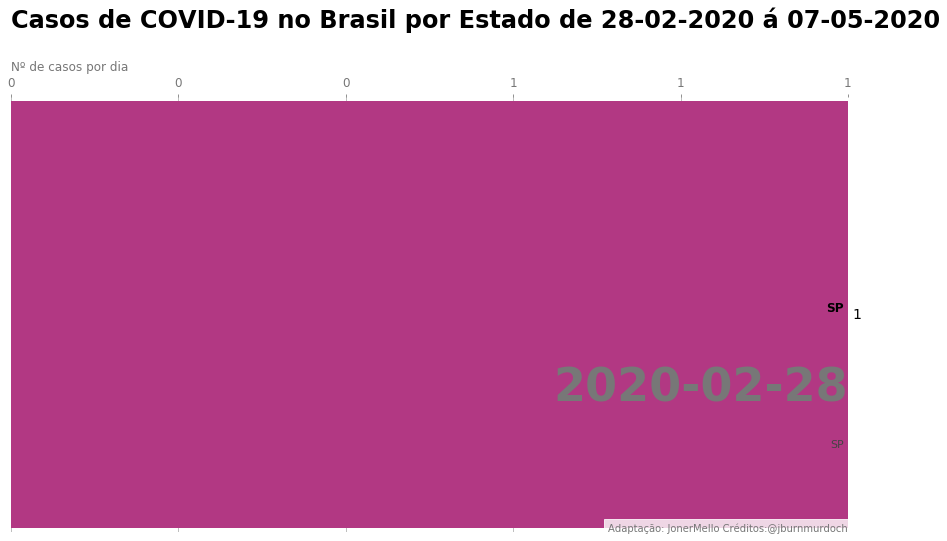

In [12]:
current_date = '2020-02-28'
fig, ax = plt.subplots(figsize=(15, 8))
def draw_barchart(date):
    dff = estados[estados['data'].eq(date)].sort_values(by='casosAcumulado', ascending=True).tail(27)
    ax.clear()
    ax.barh(dff['estado'], dff['casosAcumulado'], color=[colors[x] for x in dff['estado']])
    dx = dff['casosAcumulado'].max() / 200
    for i, (value, name) in enumerate(zip(dff['casosAcumulado'], dff['estado'])):
        ax.text(value-dx, i, name, size=12, weight=600, ha='right', va='bottom')
        ax.text(value-dx, i-.25,name, size=11, color='#444444', ha='right', va='baseline')
        ax.text(value+dx, i,     f'{value:,.0f}',  size=14, ha='left',  va='center')
    # ... polished styles
    ax.text(1, 0.3, date, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, 'Nº de casos por dia', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12,  )
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.16, 'Casos de COVID-19 no Brasil por Estado de 28-02-2020 á 07-05-2020',
            transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'Adaptação: JonerMello Créditos:@jburnmurdoch', transform=ax.transAxes, ha='right',
            color='#777777', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
draw_barchart(current_date)

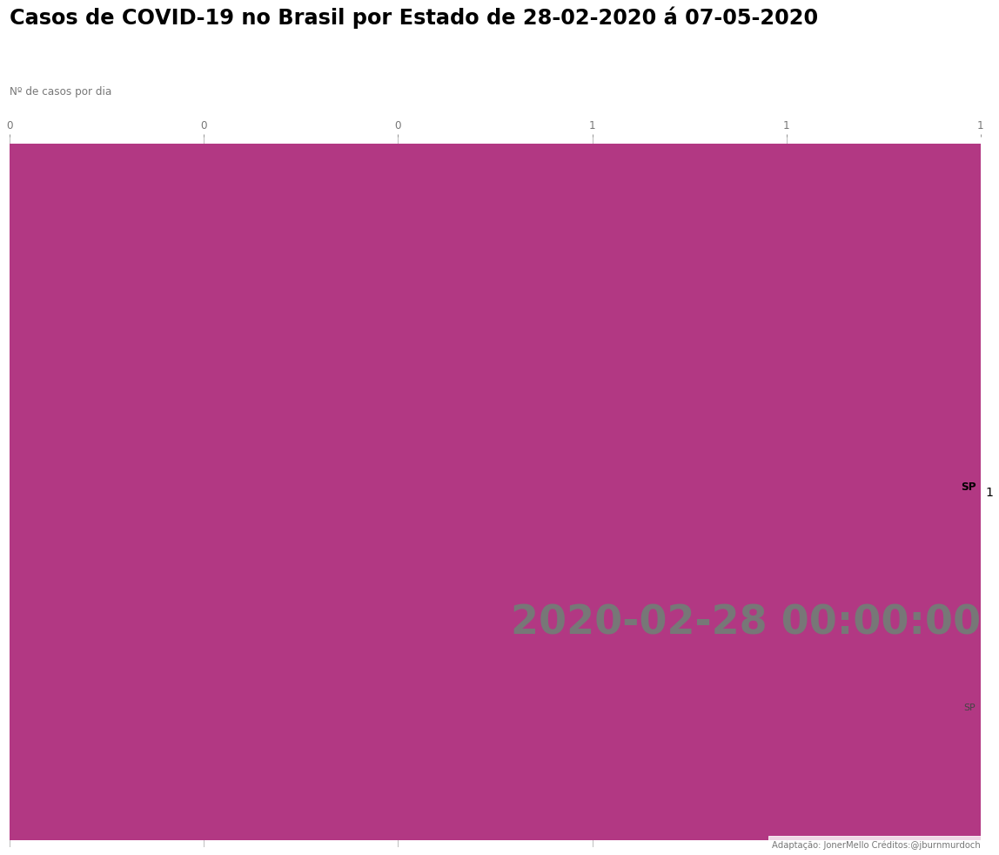

In [14]:
import matplotlib.animation as animation
from IPython.display import HTML
with plt.xkcd():
    fig, ax = plt.subplots(figsize=(20, 15))
    animator = animation.FuncAnimation(fig, draw_barchart, frames=pd.date_range(start='2020-02-28', end='2020-06-02'))
HTML(animator.to_html5_video())
#mywriter = animation.FFMpegWriter(fps=3)
#animator.save('covid-19BR.mp4', writer=mywriter)
# or use animator.to_html5_video() or animator.save()

In [ ]:
acumulado

In [ ]:
!pip install imread